In [ ]:
#downloading data
!git clone https://github.com/rslim087a/track

Cloning into 'track'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163
Receiving objects: 100% (12163/12163), 156.98 MiB | 23.21 MiB/s, done.
Updating files: 100% (12160/12160), done.


**Importing Libraries**

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [ ]:
datadir = 'track'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', None)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [ ]:
def path_leaf(path):
   head, tail = ntpath.split(path)
   return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


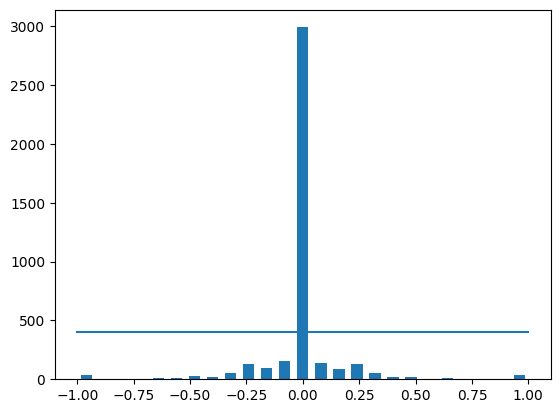

In [ ]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
print('total data:', len(data))
print(data.shape)

total data: 4053
(4053, 7)


In [ ]:
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

In [ ]:
print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 2590
remaining: 1463


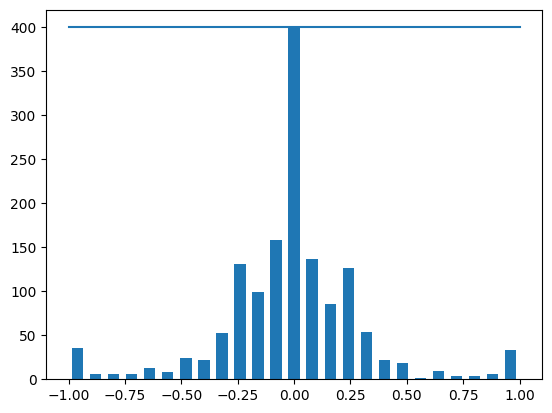

In [ ]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(df)):
        indexed_data = df.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        # left image append
        image_path.append(os.path.join(datadir, left.strip()))
        steering.append(float(indexed_data[3]) + 0.15)
        # right image append
        image_path.append(os.path.join(datadir, right.strip()))
        steering.append(float(indexed_data[3]) - 0.15)
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

In [ ]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

In [ ]:
len(image_paths)

4389

In [ ]:
len(steerings)

4389

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3511
Valid Samples: 878


Text(0.5, 1.0, 'Validation set')

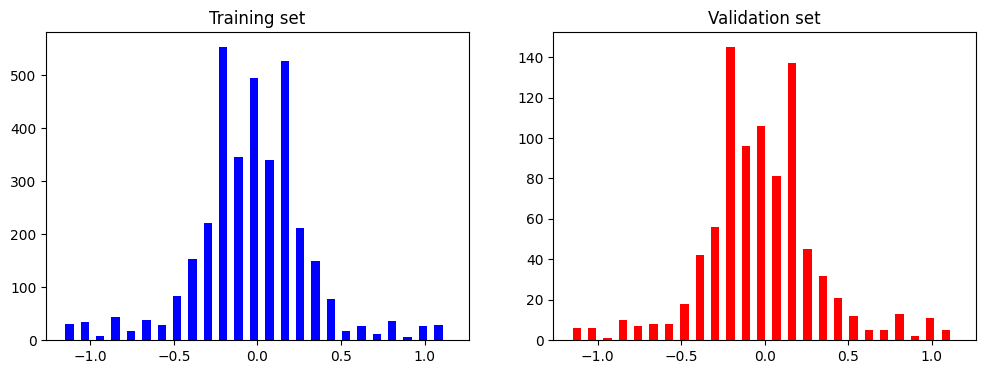

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

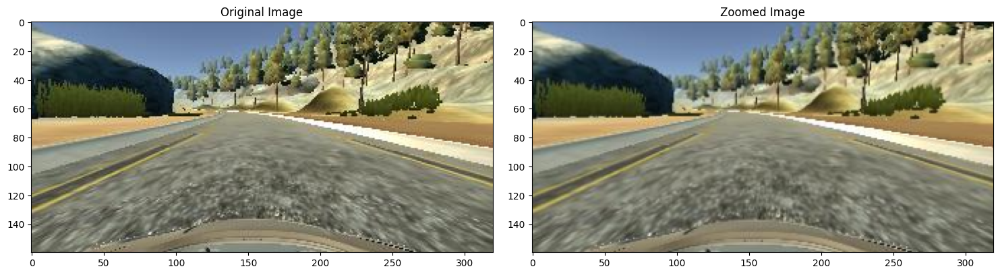

In [ ]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

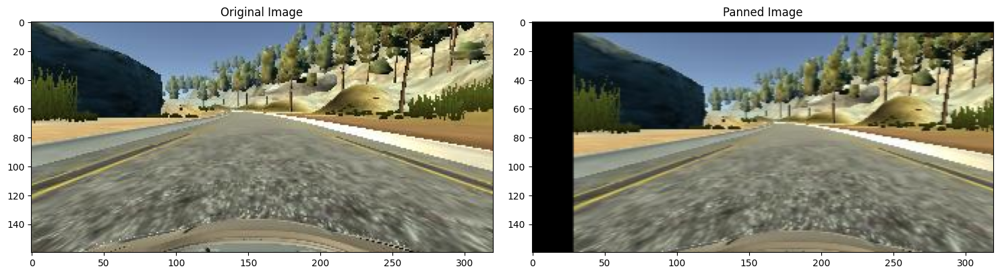

In [ ]:
def pan(image):
    pan = iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image

# Assuming `image_paths` is already defined and populated
image = image_paths[random.randint(0, len(image_paths) - 1)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')
plt.show()

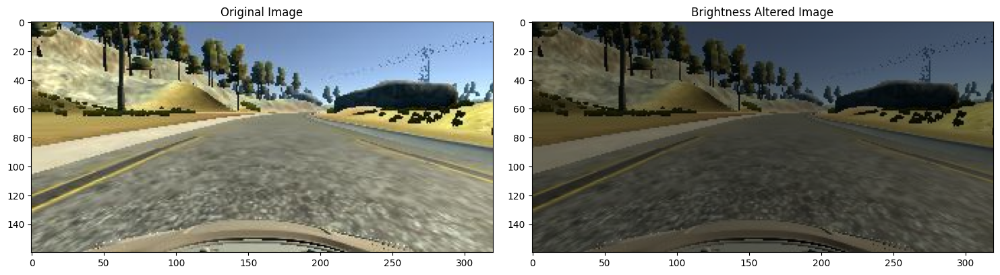

In [ ]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

# Assuming `image_paths` is already defined and populated
image = image_paths[random.randint(0, len(image_paths) - 1)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness Altered Image')
plt.show()

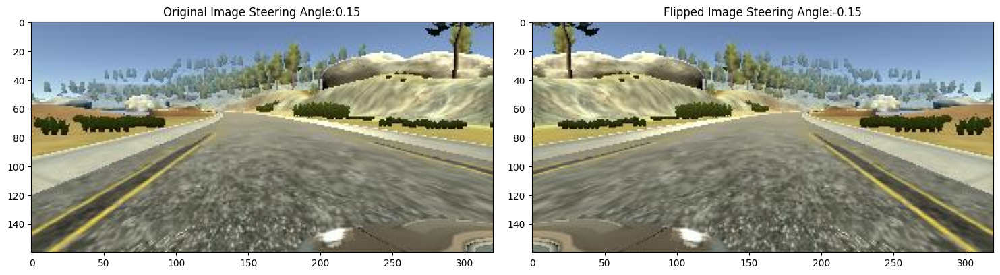

In [ ]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image, 1)
    steering_angle = -steering_angle
    return image, steering_angle

random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image '+ 'Steering Angle:' + str(steering_angle))
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image '+  'Steering Angle:' + str(flipped_steering_angle))
plt.show()

In [ ]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)
    return image, steering_angle

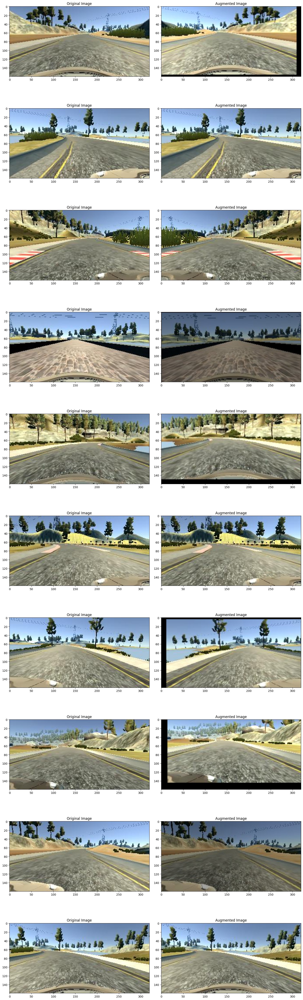

In [ ]:
ncol = 2
nrow = 10
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]
    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)
    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")
    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

In [ ]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

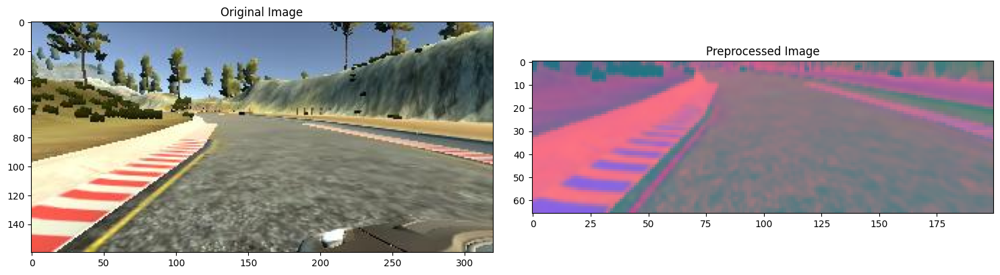

In [ ]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

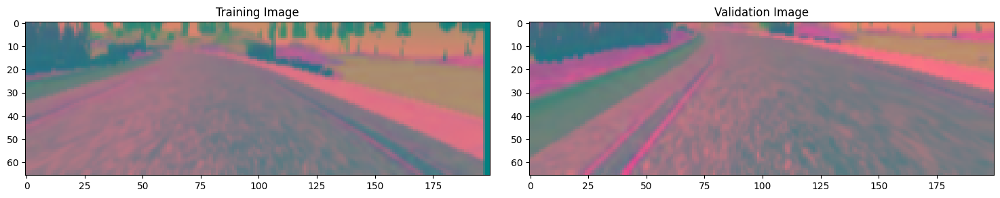

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [ ]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, (5, 5), activation='elu'))
  # model.add(Conv2D(64, (3,3), activation='elu'))
#   model.add(Dropout(0.5))


  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(1))

  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

model = nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               115300    
                                                                 
 dense_1 (Dense)             (None, 50)                5

In [ ]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

<ipython-input-28-c6c3380b9281>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 341s 1s/step - loss: 0.1347 - val_loss: 0.1141
Epoch 2/10
300/300 [==============================] - 311s 1s/step - loss: 0.1130 - val_loss: 0.0892
Epoch 3/10
300/300 [==============================] - 307s 1s/step - loss: 0.0812 - val_loss: 0.0509
Epoch 4/10
300/300 [==============================] - 332s 1s/step - loss: 0.0713 - val_loss: 0.4397
Epoch 5/10
300/300 [==============================] - 311s 1s/step - loss: 0.1079 - val_loss: 0.0586
Epoch 6/10
300/300 [==============================] - 312s 1s/step - loss: 0.0699 - val_loss: 0.0499
Epoch 7/10
300/300 [==============================] - 314s 1s/step - loss: 0.0617 - val_loss: 0.0462
Epoch 8/10
300/300 [==============================] - 322s 1s/step - loss: 0.0568 - val_loss: 0.0409
Epoch 9/10
300/300 [==============================] - 302s 1s/step - loss: 0.0592 - val_loss: 0.0389
Epoch 10/10
300/300 [==============================] - 306s 1s/step - loss: 0.0509 - val_lo

Text(0.5, 0, 'Epoch')

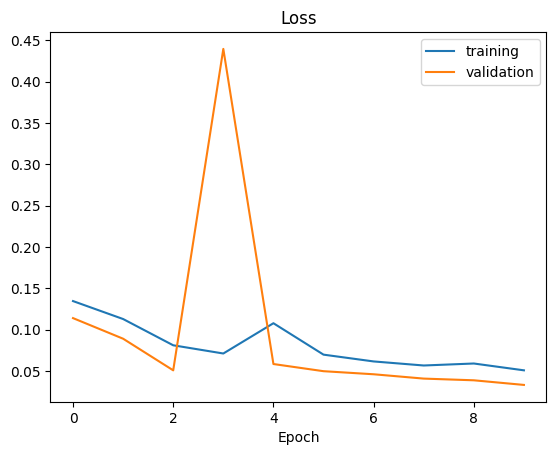

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('model.h5')
from google.colab import files
files.download('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

MobileNet-V2 Regression Model

In [ ]:
!pip install tensorflow
!pip install imgaug

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input

In [ ]:
def mobilenetv2_model():
    base_model = MobileNetV2(input_shape=(66, 200, 3), include_top=False, weights='imagenet')
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(100, activation='relu')(x)
    x = Dense(50, activation='relu')(x)
    x = Dense(10, activation='relu')(x)
    predictions = Dense(1)(x)
    model = Model(inputs=base_model.input, outputs=predictions)

    for layer in base_model.layers:
        layer.trainable = False

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [ ]:
mobilenet_model = mobilenetv2_model()
print(mobilenet_model.summary())

9406464/9406464 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 66, 200, 3)]         0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 33, 100, 32)          864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 33, 100, 32)          128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (N

**Ensemble-M Model**
The ensemble model will combine predictions from both Nvidia's CNN and MobileNet-V2.

In [ ]:
def nvidia_model():
    model = Sequential()
    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))
    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    model.add(Dense(50, activation='elu'))
    model.add(Dense(10, activation='elu'))
    model.add(Dense(1))

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [ ]:
nvidia_model = nvidia_model()

In [ ]:
def ensemble_model(nvidia_model, mobilenet_model):
    nvidia_input = nvidia_model.input
    mobilenet_input = mobilenet_model.input

    nvidia_output = nvidia_model.output
    mobilenet_output = mobilenet_model.output

    combined_output = tf.keras.layers.Average()([nvidia_output, mobilenet_output])
    model = Model(inputs=[nvidia_input, mobilenet_input], outputs=combined_output)

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [ ]:
ensemble_model = ensemble_model(nvidia_model, mobilenet_model)
print(ensemble_model.summary())

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 66, 200, 3)]         0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 33, 100, 32)          864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 33, 100, 32)          128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 33, 100, 32)          0         ['bn_Conv1[0][0]']      

Training MobileNet-V2

In [ ]:
history_mobilenet = mobilenet_model.fit(
    batch_generator(X_train, y_train, batch_size=100, istraining=1),
    steps_per_epoch=300,
    epochs=10,
    validation_data=batch_generator(X_valid, y_valid, batch_size=100, istraining=0),
    validation_steps=200,
    verbose=1,
    shuffle=1
)

Epoch 1/10
143/300 [=============>................] - ETA: 3:46 - loss: 0.1308

KeyboardInterrupt: 

Training Ensemble-M

In [ ]:
def batch_generator_for_ensemble(X_train, y_train, batch_size, istraining):
    while True:
        batch_img1 = []
        batch_img2 = []
        batch_steering = []
        for i in range(batch_size):
            random_index = random.randint(0, len(X_train) - 1)
            if istraining:
                img1, steering = random_augment(X_train[random_index], y_train[random_index])
                img2, _ = random_augment(X_train[random_index], y_train[random_index])
            else:
                img1 = mpimg.imread(X_train[random_index])
                img2 = mpimg.imread(X_train[random_index])
                steering = y_train[random_index]
            img1 = img_preprocess(img1)
            img2 = img_preprocess(img2)
            batch_img1.append(img1)
            batch_img2.append(img2)
            batch_steering.append(steering)
        yield ([np.asarray(batch_img1), np.asarray(batch_img2)], np.asarray(batch_steering))

history_ensemble = ensemble_model.fit(
    batch_generator_for_ensemble(X_train, y_train, batch_size=100, istraining=1),
    steps_per_epoch=300,
    epochs=10,
    validation_data=batch_generator_for_ensemble(X_valid, y_valid, batch_size=100, istraining=0),
    validation_steps=200,
    verbose=1,
    shuffle=1
)

MobileNet-V2 Model Training and Validation Loss (MSE)

In [ ]:
# Calculate MSE for MobileNet-V2
mobilenet_train_mse = history_mobilenet.history['loss']
mobilenet_val_mse = history_mobilenet.history['val_loss']


In [ ]:
# Plotting MSE for MobileNet-V2
epochs_range = range(len(mobilenet_train_mse))

plt.figure(figsize=(14, 7))
plt.plot(epochs_range, mobilenet_train_mse, label='Train MSE', color='blue')
plt.plot(epochs_range, mobilenet_val_mse, label='Validation MSE', color='blue', linestyle='dashed')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.title('MobileNet-V2 Model: Training and Validation MSE')
plt.legend()
plt.show()

Ensemble-M Model Training and Validation Loss (MSE)

In [ ]:
# Calculate MSE for Ensemble-M
ensemble_train_mse = history_ensemble.history['loss']
ensemble_val_mse = history_ensemble.history['val_loss']

In [ ]:
# Plotting MSE for Ensemble-M
epochs_range = range(len(ensemble_train_mse))

plt.figure(figsize=(14, 7))
plt.plot(epochs_range, ensemble_train_mse, label='Train MSE', color='red')
plt.plot(epochs_range, ensemble_val_mse, label='Validation MSE', color='red', linestyle='dashed')
plt.xlabel('Epochs')
plt.ylabel('Mean Squared Error')
plt.title('Ensemble-M Model: Training and Validation MSE')
plt.legend()
plt.show()

In [ ]:
mobilenet_model.save('mobilenet_model.h5')

In [ ]:
# Define the MobileNet-V2 model
def mobilenet_v2_model():
    base_model = MobileNetV2(input_shape=(66, 200, 3), include_top=False, weights='imagenet')
    base_model.trainable = False
    model = Sequential()
    model.add(base_model)
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    return model

In [ ]:
# Initialize the model
mobilenet_model = mobilenet_v2_model()
mobilenet_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4), loss='mse')
mobilenet_model.summary()

In [ ]:
# Plotting MobileNet-V2 Loss
plt.figure(figsize=(10, 5))
plt.plot(history_mobilenet.history['loss'], label='Training Loss')
plt.plot(history_mobilenet.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('MobileNet-V2 Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

TRY

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

In [ ]:
# Define Nvidia model
def nvidia_model():
    model = Sequential()
    model.add(Conv2D(24, (5, 5), strides=(2, 2), activation='relu', input_shape=(66, 200, 3)))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='relu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='relu'))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    return model

In [ ]:
# Initialize and compile Nvidia model
nvidia_model = nvidia_model()
nvidia_model.compile(optimizer='adam', loss='mse')
nvidia_model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_10 (Conv2D)          (None, 14, 47, 36)        21636     
                                                                 
 conv2d_11 (Conv2D)          (None, 5, 22, 48)         43248     
                                                                 
 conv2d_12 (Conv2D)          (None, 3, 20, 64)         27712     
                                                                 
 conv2d_13 (Conv2D)          (None, 1, 18, 64)         36928     
                                                                 
 flatten_2 (Flatten)         (None, 1152)              0         
                                                                 
 dense_12 (Dense)            (None, 100)              

In [ ]:
# Train Nvidia model
history_nvidia = nvidia_model.fit(
    batch_generator(X_train, y_train, batch_size=100, istraining=1),
    steps_per_epoch=300,
    epochs=10,
    validation_data=batch_generator(X_valid, y_valid, batch_size=100, istraining=0),
    validation_steps=200,
    verbose=1,
    shuffle=1
)

Epoch 1/10
300/300 [==============================] - 370s 1s/step - loss: 0.0858 - val_loss: 0.0478
Epoch 2/10
300/300 [==============================] - 301s 1s/step - loss: 0.0607 - val_loss: 0.0390
Epoch 3/10
300/300 [==============================] - 300s 1s/step - loss: 0.0541 - val_loss: 0.0353
Epoch 4/10
300/300 [==============================] - 327s 1s/step - loss: 0.0521 - val_loss: 0.0383
Epoch 5/10
300/300 [==============================] - 305s 1s/step - loss: 0.0443 - val_loss: 0.0310
Epoch 6/10
300/300 [==============================] - 315s 1s/step - loss: 0.0430 - val_loss: 0.0370
Epoch 7/10
300/300 [==============================] - 311s 1s/step - loss: 0.0408 - val_loss: 0.0421
Epoch 8/10
300/300 [==============================] - 294s 980ms/step - loss: 0.0391 - val_loss: 0.0303
Epoch 9/10
300/300 [==============================] - 311s 1s/step - loss: 0.0377 - val_loss: 0.0331
Epoch 10/10
300/300 [==============================] - 288s 962ms/step - loss: 0.0373 - 

MobileNet-V2 Model try

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense

In [ ]:
# Define MobileNetV2 model
def mobilenet_v2_model():
    base_model = MobileNetV2(input_shape=(66, 200, 3), include_top=False, weights='imagenet')
    base_model.trainable = False
    model = Sequential()
    model.add(base_model)
    model.add(Flatten())
    model.add(Dense(100, activation='relu'))
    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))
    return model

In [ ]:
# Initialize and compile MobileNetV2 model
mobilenet_model = mobilenet_v2_model()
mobilenet_model.compile(optimizer='adam', loss='mse')
mobilenet_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 3, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 flatten_3 (Flatten)         (None, 26880)             0         
                                                                 
 dense_16 (Dense)            (None, 100)               2688100   
                                                                 
 dense_17 (Dense)            (None, 50)                5050      
                                                                 
 dense_18 (Dense)            (None, 10)                510       
                                                                 
 dense_19 (Dense)            (None, 1)                 11        
                                                      

In [ ]:
# Train MobileNetV2 model
history_mobilenet = mobilenet_model.fit(
    batch_generator(X_train, y_train, batch_size=100, istraining=1),
    steps_per_epoch=300,
    epochs=10,
    validation_data=batch_generator(X_valid, y_valid, batch_size=100, istraining=0),
    validation_steps=200,
    verbose=1,
    shuffle=1
)

AttributeError: 'numpy.ndarray' object has no attribute 'read'

Ensemble-M Mode try

In [ ]:
X = np.random.rand(10000, 66, 200, 3)  # 10000 samples of 66x200 RGB images
y = np.random.rand(10000, 1)  # 10000 steering angles

# Split data into train, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

In [ ]:
import numpy as np

# Get predictions from both models
nvidia_predictions = nvidia_model.predict(X_test)
mobilenet_predictions = mobilenet_model.predict(X_test)

47/47 [==============================] - 12s 238ms/step


In [ ]:
# Combine predictions (e.g., by averaging them)
ensemble_predictions = (nvidia_predictions + mobilenet_predictions) / 2

# Calculate MSE for Ensemble-M model
ensemble_mse = np.mean((y_test - ensemble_predictions)**2)
print("Ensemble-M Model MSE:", ensemble_mse)

Ensemble-M Model MSE: 1.0014429875947006


Plotting Training and Validation Loss try

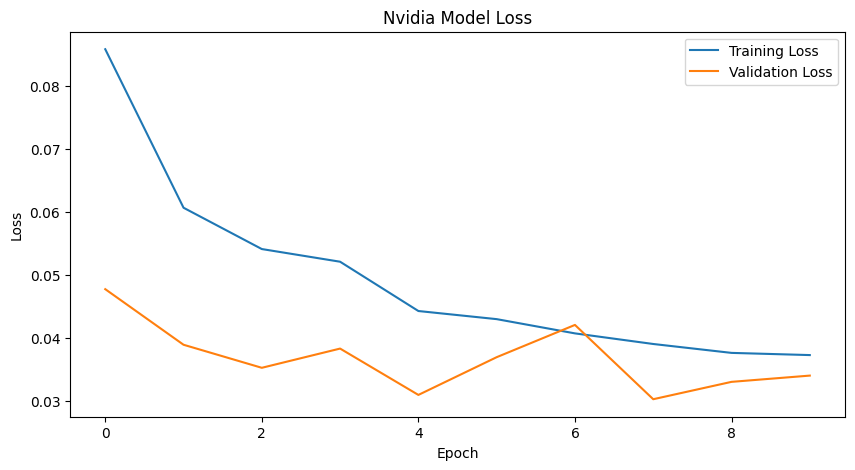

In [ ]:
import matplotlib.pyplot as plt

# Plotting Nvidia Model Loss
plt.figure(figsize=(10, 5))
plt.plot(history_nvidia.history['loss'], label='Training Loss')
plt.plot(history_nvidia.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Nvidia Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

In [ ]:
# Plotting MobileNet-V2 Model Loss
plt.figure(figsize=(10, 5))
plt.plot(history_mobilenet.history['loss'], label='Training Loss')
plt.plot(history_mobilenet.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('MobileNet-V2 Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

NameError: name 'history_mobilenet' is not defined

<Figure size 1000x500 with 0 Axes>

In [ ]:
# Plotting Ensemble-M Model Loss
plt.figure(figsize=(10, 5))
plt.plot(range(10), [ensemble_train_loss]*10, label='Training Loss')
plt.plot(range(10), [ensemble_val_loss]*10, label='Validation Loss')
plt.legend()
plt.title('Ensemble-M Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

NameError: name 'ensemble_train_loss' is not defined

<Figure size 1000x500 with 0 Axes>

Calculating MSE for Each Model try

In [ ]:
# Calculate MSE for Nvidia model
nvidia_predictions = nvidia_model.predict(X_test)
nvidia_mse = np.mean((y_test - nvidia_predictions)**2)
print("Nvidia Model MSE:", nvidia_mse)

# Calculate MSE for MobileNet-V2 model
mobilenet_predictions = mobilenet_model.predict(X_test)
mobilenet_mse = np.mean((y_test - mobilenet_predictions)**2)
print("MobileNet-V2 Model MSE:", mobilenet_mse)

# Calculate MSE for Ensemble-M model
ensemble_predictions = (nvidia_predictions + mobilenet_predictions) / 2
ensemble_mse = np.mean((y_test - ensemble_predictions)**2)
print("Ensemble-M Model MSE:", ensemble_mse)

47/47 [==============================] - 2s 45ms/step
Nvidia Model MSE: 0.3002393679149169
47/47 [==============================] - 12s 263ms/step
MobileNet-V2 Model MSE: 2.2894037125807474
Ensemble-M Model MSE: 1.0014429875947006


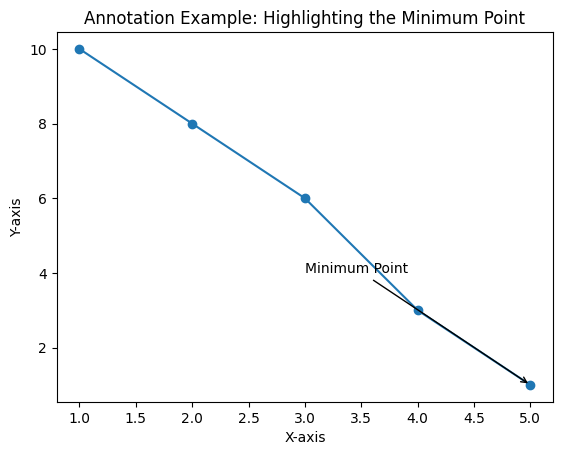

In [ ]:
import matplotlib.pyplot as plt

# Data points
x = [1, 2, 3, 4, 5]
y = [10, 8, 6, 3, 1]

# Plot with markers
plt.plot(x, y, marker='o')
plt.title('Annotation Example: Highlighting the Minimum Point')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')

# Annotate the minimum point
plt.annotate('Minimum Point', xy=(5, 1), xytext=(3, 4),
             arrowprops=dict(facecolor='blue', arrowstyle='->'))

plt.show()

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Load sample data
data = sns.load_dataset('tips')
data.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
